# Importance Score for Dataset Training Samples 

As suggested by the mentor one approach to assess the importance of each data point in training model would be to remove it from the train data and check the evaluation metric with and without it. This is a rather cumbersome approach as each data point will have to be removed and added which would increase the computation cost by a lot considering the size of dataset.

#### Suggested Approach:
We could assign weights to individual data points in the training set which would indicate the importance of considering it while training. Now, addressing the first question that would come to anyone's mind after reading the previous statement. How do we assign the weights?

- We first predict how similar the train data is to the test data and then assign more weights to those train samples that are similar to the test data.
- With this approach we can achieve the following:
    - We can train our model depending on the result that is needed.
    - We can improve the f1-score as recall is increased by this approach.
    
#### Flow of the notebook:
1. Loading data
2. Studying the data
3. Splitting data
4. Pre-processing on data (adding `is_train` column to data)
5. Combining train and test data (dropping target `Class` from train)
6. Performing `StratifiedKFold` splitting and using `RandomForestClassifier` to predict the probability of the data point being similar to test set
7. Calculating and assigning weights to train data points based on the predictions made above. (`w = P(test)/P(train)`)
8. Using the weights in RFC and predicting on our test data

## 1. Loading Data

In [1]:
# importing required libraries
import warnings
import numpy as np
import pandas as pd
import data_importance as di

from IPython.core.display import display, HTML

display(HTML("<style>.container { width:100% !important; }</style>"))
%matplotlib inline
warnings.filterwarnings('ignore')

In [2]:
# loading data by specifying the folder name and csv file name
data = di.read_data('datasets','eeg')
data.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,Class
0,4329.23,4009.23,4289.23,4148.21,4350.26,4586.15,4096.92,4641.03,4222.05,4238.46,4211.28,4280.51,4635.90,4393.85,1
1,4324.62,4004.62,4293.85,4148.72,4342.05,4586.67,4097.44,4638.97,4210.77,4226.67,4207.69,4279.49,4632.82,4384.10,1
2,4327.69,4006.67,4295.38,4156.41,4336.92,4583.59,4096.92,4630.26,4207.69,4222.05,4206.67,4282.05,4628.72,4389.23,1
3,4328.72,4011.79,4296.41,4155.90,4343.59,4582.56,4097.44,4630.77,4217.44,4235.38,4210.77,4287.69,4632.31,4396.41,1
4,4326.15,4011.79,4292.31,4151.28,4347.69,4586.67,4095.90,4627.69,4210.77,4244.10,4212.82,4288.21,4632.82,4398.46,1


## 2. Study Data

In [3]:
# Studying the data using pandas_profiling
di.study_data(data)

## 3. Splitting Data

In [4]:
# splitting data by passsing inputs as the dataframe to be splitted, test size and a string explaining the target column name
X_train, X_test, y_train, y_test, train, test = di.data_split(data, 0.25, 'Class')

## 4. Pre-Processing

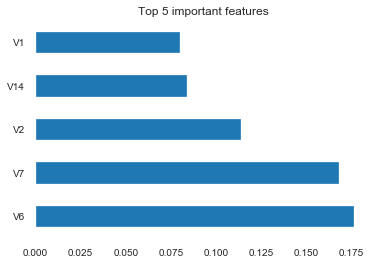

In [5]:
# Adding a new column 'is_train' to train and test data and visualising the top 5 features that are going to affect the model performance
train, test = di.preprocessing(train, test, X_train, y_train)

## 5. Combining pre-processed Train and Test data

In [6]:
# combining train and test data after preprocesing and pssing a string indicating the target column name
x, y, tst, trn = di.combine_train_test(train, test, 'Class')

## 6. Performing StratifiedKFold splitting and using RandomForestClassifier

In [7]:
# Performing StratifiedKFold splitting and using RandomForestClassifier to predict the probability of the data point being similar to test set
predictions = di.stratkf_split(x, y)

ROC-AUC: 0.5084297982184601


## 7. Calculating Weights for Train Data

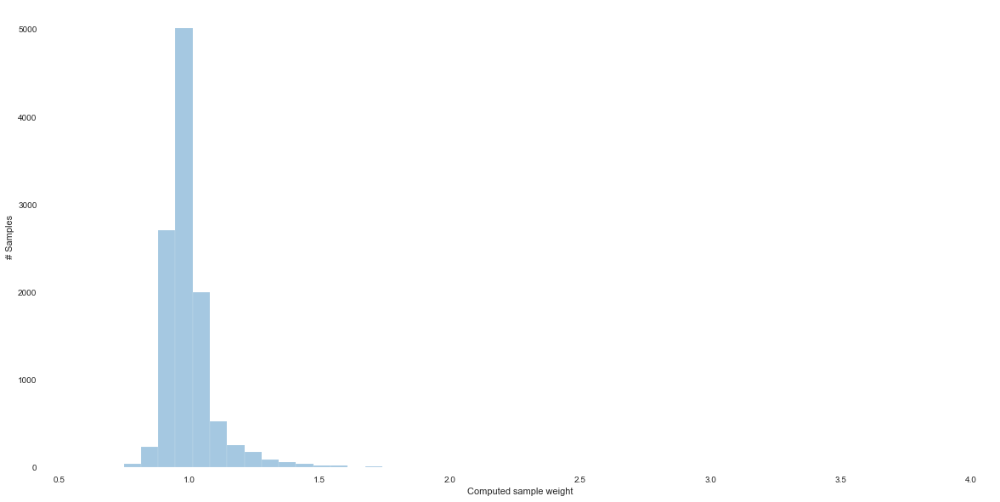

In [8]:
# calculating weights and displaying number of samples having the computed weights
weights = di.calc_weights(predictions, trn)

## 8. Using the weights in RFC and predicting on our test data

In [9]:
di.rfc_model(weights, X_train, y_train, X_test, y_test)

              precision    recall  f1-score   support

           1       0.85      0.93      0.89      2044
           2       0.90      0.81      0.85      1700

    accuracy                           0.87      3744
   macro avg       0.88      0.87      0.87      3744
weighted avg       0.87      0.87      0.87      3744

[[1893  151]
 [ 331 1369]]


From the above evaluation metric we can see that our model has equal sensitivity and specifiity. Accoring to the result needed it can be made more specific or sensitive as explained in [PR #74](https://github.com/mozilla/PRESC/pull/74)
Using the approach we have been able to assign importance weight to each data point in train data using Density Ratio Estimation. 

In [20]:
# Calculating the rows that have weights more than 1. The following returns the index of the rows
index = [i for i, e in enumerate(weights) if e > 1]

# checing the rows with indices obtained from above
data.loc[index]

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,Class
1,4324.62,4004.62,4293.85,4148.72,4342.05,4586.67,4097.44,4638.97,4210.77,4226.67,4207.69,4279.49,4632.82,4384.10,1
4,4326.15,4011.79,4292.31,4151.28,4347.69,4586.67,4095.90,4627.69,4210.77,4244.10,4212.82,4288.21,4632.82,4398.46,1
5,4321.03,4004.62,4284.10,4153.33,4345.64,4587.18,4093.33,4616.92,4202.56,4232.82,4209.74,4281.03,4628.21,4389.74,1
6,4319.49,4001.03,4280.51,4151.79,4343.59,4584.62,4089.74,4615.90,4212.31,4226.67,4201.03,4269.74,4625.13,4378.46,1
10,4326.15,4010.77,4272.82,4143.08,4342.56,4579.49,4087.69,4615.90,4206.15,4228.72,4210.77,4272.82,4631.79,4382.56,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11219,4291.79,3982.05,4273.33,4118.46,4359.49,4643.08,4095.38,4629.23,4212.31,4242.05,4218.46,4283.59,4625.64,4380.00,2
11222,4282.56,3980.00,4263.59,4112.82,4364.10,4643.59,4100.51,4635.90,4217.95,4235.90,4206.67,4275.90,4610.26,4366.15,2
11223,4276.92,3970.77,4262.56,4107.69,4363.08,4644.10,4100.51,4634.87,4212.82,4235.90,4205.13,4266.15,4609.23,4361.54,2
11224,4281.54,3975.90,4262.56,4108.21,4364.62,4637.44,4097.95,4628.21,4209.23,4240.51,4205.13,4263.59,4611.79,4369.74,2


The above function can be changed to visualise the rows having a certain weight value calculated. (Change `e>1` to `e>1.5` for visualising rows with weights more than 1.5)